This is just continuing directly from notebook 2. 

In [180]:
# Import public packages.
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi 
from importlib import reload
import pickle
import gzip
import re
from pomegranate import *

# Import my packages.
%matplotlib inline
import matplotlib as mpl
%matplotlib notebook
%matplotlib notebook

import sys
from importlib import reload
sys.path.append('/Users/michaelstadler/Bioinformatics/Projects/insulators/bin')
from hic_jupyter import viewer
import hic_jupyter as hc

## Functions

Copying functions from notebook 1:

In [2]:
# Make sample data matrix.

def make_sample_data(files, genome_size, bin_size=500):
    num_bins = int(genome_size // bin_size)
    data = np.zeros((num_bins, len(files)))
    
    for i in range(0, len(files)):
        file = files[i]
        if (file[-2:] == 'gz'):
            f = gzip.open(file, 'rt')
        
        else:
            f = open(files[i], 'r')
        for line in f:
            line = line.rstrip()
            chr_, bin_, val = line.split()
            val = float(val)
            bin_ = int(bin_)
            data[bin_, i] = val

    return data

In [3]:
# Takes a list of coordinates (hand-called boundaries) and output from make_sample_data, returns
# matched data (essentiallly a slice of X_data) and labels (1 where boundary called, 0 elsewhere).

# Only for single chromosome at the moment.

def make_training_data(x, coordfiles, buffer=10, binsize=500):
    def process_coordfile(x, coordfile, buffer, binsize):
        y = np.zeros((x.shape[0]))
        min_ = np.inf
        max_ = -np.inf
        
        f = open(coordfile, 'r')
        for line in f:
            line = line.rstrip()
            if (line[0] == '#'):
                pass
            else:
                chr_, pos1, pos2 = line.split()
                pos1 = float(pos1)
                pos2 = float(pos2)
                pos = np.mean([pos1, pos2]) * 1e6
                bin_ = int(pos / binsize)
                if (bin_ < min_):
                    min_ = bin_
                if (bin_ > max_):
                    max_ = bin_
                y[bin_] = 1
        training_data = x[(min_ - buffer):(max_ + buffer), :]
        class_labels = y[(min_ - buffer):(max_ + buffer)]
        f.close()
        return training_data, class_labels
    
    data, labels = process_coordfile(x, coordfiles[0], buffer, binsize)
    for i in range(1, len(coordfiles)):
        new_data, new_labels = process_coordfile(x, coordfiles[i], buffer, binsize)
        data = np.vstack((data, new_data))
        labels = np.hstack((labels, new_labels))
    
    return data, labels    


In [4]:
# Take hand-called coordinates and an insulation score data file, re-assign boundary 
# to local peak bin (if necessary) and also to adjacent bins if needed, return label
# array with bins in the hand-called areas labels 0 (not boundary) or 1 (boundary)
# and all other positions -1.

def labels_from_hand_calls(coord_files, ins_data, adjacent=2, stringency=0.66, binsize=500):
    labels = np.repeat(-1, ins_data.shape[0])
    for coordfile in coord_files:
        f = open(coordfile, 'r')
        bin_min = np.inf
        bin_max = -np.inf
        for line in f:
            line = line.rstrip()
            if (line[0] == '#'):
                pass
            else:
                chr_, pos1, pos2 = line.split()
                pos1 = float(pos1)
                pos2 = float(pos2)
                pos = np.mean([pos1, pos2]) * 1e6
                bin_ = int(pos / binsize)
                if (bin_ > bin_max):
                    bin_max = bin_
                if (bin_ < bin_min):
                    bin_min = bin_
                    
                window_start = bin_ - adjacent
                window_end = bin_ + adjacent
                local_max = np.max(ins_data[window_start:(window_end+1)])
                thresh = local_max * stringency
                for i in range(window_start, window_end+1):
                    val = ins_data[i]
                    if (val >= thresh):
                        labels[i] = 0
        labels[bin_min:(bin_max+1)] += 1         
        f.close()
    return labels


In [5]:
# Load 1D coverage data.
def load_track_data(trackfile_path):
    """Load genomic track data."""
    track_binsize = 500
    track_data = {}
    with gzip.open(trackfile_path, 'rt') as infile:
        for line in infile:
            items = line.split()
            (chr_, bin_, val) = items
            chr_ = re.sub('chr', '', chr_)
            if (chr_ not in track_data):
                track_data[chr_] = np.zeros(int(1e8 / 500))
            bin_ = int(bin_)
            if (bin_ < len(track_data[chr_])):
                track_data[chr_][bin_] = float(val)
    return track_data

In [6]:
def flip(x):
    return -1 * (np.array(x) - 1)

In [7]:
def normcol(x):
    x_new = x.copy()
    for i in range(0, x.shape[1]):
        x_new[:,i] = (x_new[:,i] - np.mean(x_new[:,i])) / np.std(x_new[:,i])
    return x_new

In [365]:
import re
import os
import pandas as pd
import gzip

def boundary_score(infolder, outfilepath, windowsize, binsize, maskfile=None, mask_dilate=0, mode='directionality', diff_window=1, leftright_dist=4, nan_buffersize=3, lag=0):
    
    def not_valid_file(filename):
        if (re.search('txt.gz', filename)):
            name_items = re.sub('.txt.gz', '', filename)
            if (len(name_items.split('_')) == 4):
                return False
        return True
    
    def add_panel(infolder, filename, scores, windowsize, binsize, chr_maxes, chr_max_bins, nan_buffersize):
        min_nonnan = 0.5 * nan_buffersize
        if not_valid_file(filename):
            return
        x = np.genfromtxt(os.path.join(infolder, filename))
        #x[np.isnan(x)] = 0.5
        x[x == 0] = 0.5
        
        name_items = re.sub('.txt.gz', '', filename)
        chr_, start, end, file_binsize = name_items.split('_')
        start_bin = int(int(start) / binsize)
        end_bin = int(int(end) / binsize)
        
        if (int(file_binsize) == binsize):
            if (chr_ not in scores):
                scores[chr_] = np.zeros(chr_max_bins)
            if (chr_ not in chr_maxes):
                chr_maxes[chr_] = end_bin
            if (end_bin > chr_maxes[chr_]):
                chr_maxes[chr_] = end_bin
                
            panel_size_bins = end_bin - start_bin
            for n in range(windowsize, panel_size_bins - windowsize + 1):
                left_window = x[n+lag, (n-windowsize):n]
                right_window = x[n+lag, (n+1):(n+windowsize+1)]
                if ((np.count_nonzero(~np.isnan(left_window[(-1 * nan_buffersize):])) > min_nonnan) and
                    (np.count_nonzero(~np.isnan(right_window[:nan_buffersize])) > min_nonnan)):
                    mean_left = np.nanmean(left_window)
                    mean_right = np.nanmean(right_window)
                    logratio = np.log(mean_right / mean_left)
                    genome_bin = start_bin + n
                    scores[chr_][genome_bin] = logratio
    
    def mask_scores(scores, maskfile, mask_dilate):
        with gzip.open(maskfile, 'rb') as f:
            for line in f:
                line = line.rstrip()
                chr_, bin_, val = line.split()
                bin_ = int(bin_)
                if chr_ in scores:
                    start_bin = np.max(0, bin_ - mask_dilate)
                    end_bin = np.min(len(scores), bin_ + mask_dilate)
                    for i in range(start_bin, end_bin+1):
                        scores[chr_][i] = np.nan
        
    
    chr_max_size = 1e8
    chr_max_bins = int(chr_max_size // binsize)
    chr_maxes = {}
    scores = {}
    files = os.listdir(infolder)
    
    for file in files:
        add_panel(infolder, file, scores, windowsize, binsize, chr_maxes, chr_max_bins, nan_buffersize)
    
    if (maskfile):
        scores = mask_scores(scores, maskfile, mask_dilate)
        
    
    outfile = open(outfilepath, 'w')
    for chr_ in chr_maxes.keys():
        if mode == 'derivative':
            roll_avg = pd.Series(scores[chr_]).rolling(2).mean()
            # Because differences are subtracted from the left, we need rolling averages assigned
            # to the left as well. There's no way to do that in rolling function, so series is  
            # manually shifted 1 position to left.
            roll_avg = roll_avg.shift(-1)
            scores[chr_] = roll_avg.diff(diff_window)
        
        elif mode == 'left':
            # Rolling mean of leftright_dist bins assigned to rightmost bin.
            rolling_mean = pd.Series(scores[chr_]).rolling(leftright_dist).mean()
            # Value now represents the mean of the leftright_dist bins to the left (not including self)
            rolling_mean = rolling_mean.shift(1)
            scores[chr_] = rolling_mean
        
        elif mode == 'right':
            # Rolling mean of leftright_dist bins assigned to rightmost bin.
            rolling_mean = pd.Series(scores[chr_]).rolling(leftright_dist).mean()
            # Value now represents the mean of the leftright_dist bins to the left (not including self)
            rolling_mean = rolling_mean.shift(-1 * leftright_dist)
            scores[chr_] = rolling_mean
            
        # If mode is anything else, just writes directionality.

        for bin_ in range(0, chr_maxes[chr_]):
            score = scores[chr_][bin_]
            if (score != 0):
                outfile.write(chr_ + '\t' + str(bin_) + '\t' + str(score) + '\n')
    outfile.close()

In [318]:
boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_masked',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_v2_nan10.txt',
              75, 500, mode='derivative', nan_buffersize=10)

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


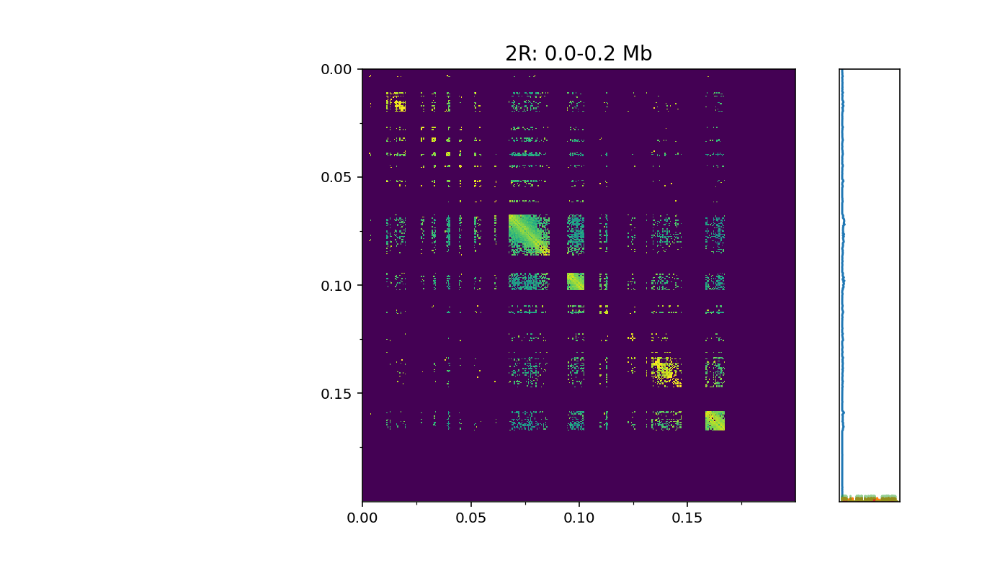

In [22]:
data_folder = '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_masked'
track_folder = '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks'
save_folder = '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R'
hc.viewer(data_folder, track_folder, save_folder)

There are definitely still issues around low-coverage bins. At least one issue seems to be bins that should be masked but aren't, and the sparse reads give weird outcomes. I think I should do a more stringent masking using a threshold from the mappability data. It's simple and straightforward and would do the trick in a conservative way.

In [12]:
mability = load_track_data('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/mappability_1dBinCounts_500.txt.gz')

In [24]:
np.mean(mability['2R'][mability['2R'] > 0])

43.15665107618646

In [26]:
for t in [1, 2, 5, 10]:
    outfile = '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/masking_mappability_hardthresh_' + str(t) + '.txt'
    out = open(outfile, 'w')
    for chr_ in mability.keys():
        for i in range(0, len(mability[chr_])):
            val = mability[chr_][i]
            if (val <= t):
                out.write(chr_ + '\t' + str(i) + '\t1\n')
    out.close()

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


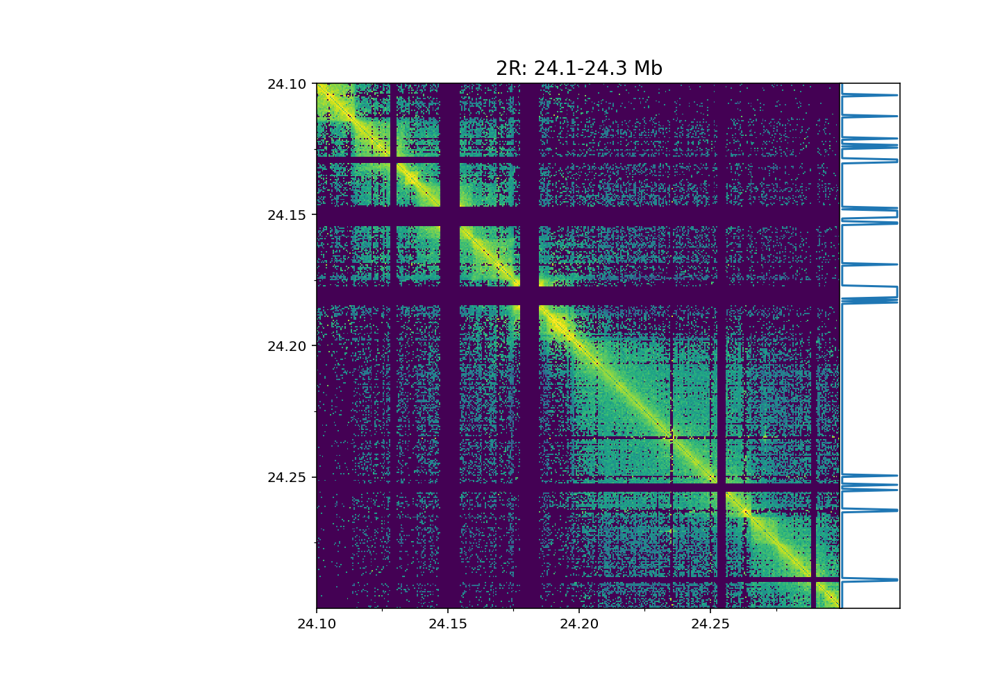

In [27]:
data_folder = '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_masked'
track_folder = '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks'
save_folder = '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R'
hc.viewer(data_folder, track_folder, save_folder)

It looks like hard masking will do a lot of good, using a 1 or 2 threshold. But also...I think the masking wasn't done with enough reads. A useful thing to do tomorrow would be to re-do it with at least 10x reads. For now, I'll use what I have and redo insulation derivative score.

In [29]:
boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmasked_t2',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask2_nan10.txt',
              75,500, 'derivative', nan_buffersize=10)

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


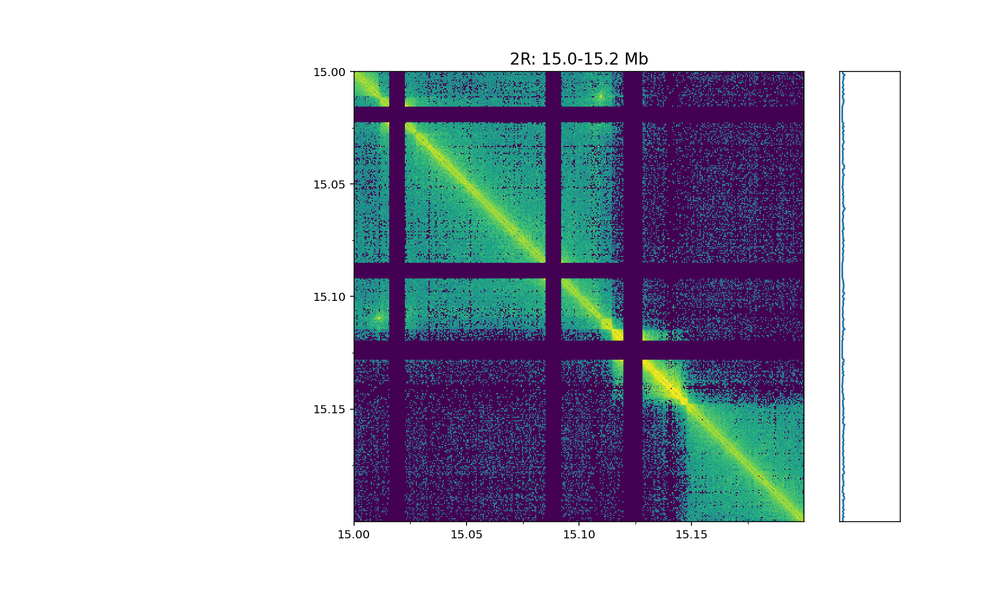

In [30]:
hc.viewer(data_folder, track_folder, save_folder)

Hard masking is good...what about also including mappability in the model? Or alternately, post-masking boundaries that arise from low mappability? Basically, I have that track, could use it to clean things up in multiple ways. Let's see how hardmasking does in a boundary calling model.

<IPython.core.display.Javascript object>


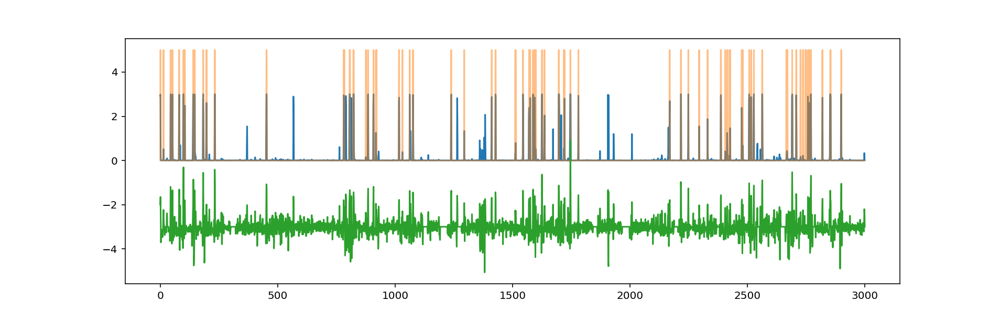

In [35]:
# Original.
files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_v2.txt.gz',
        '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/leftwindow_3.txt.gz',
         '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/rightwindow_3.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = normcol(X[labeled])
y_train = y[labeled]

# Full model.
bayes = BayesClassifier.from_samples(MultivariateGaussianDistribution, x_train, y_train)
output = bayes.predict_proba(x_train)
start=0
end=3000

plt.plot(-1 * output[:,0][start:end]*3 + 3)
plt.plot(y_train[start:end] * 5, alpha=0.5)
plt.plot(x_train[:,0][start:end] * 0.5 - 3)

<IPython.core.display.Javascript object>


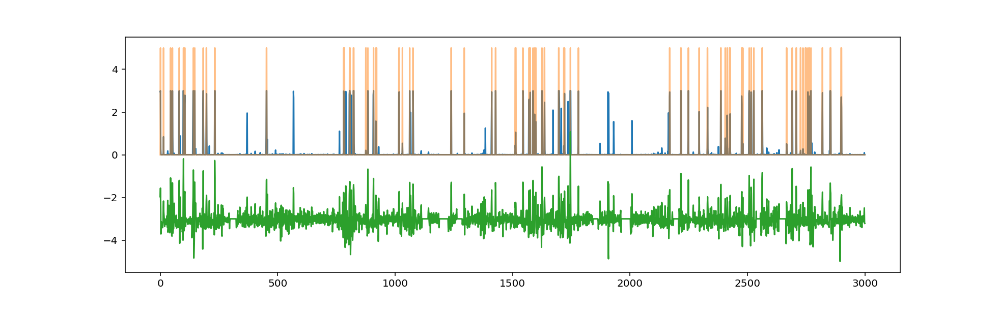

In [36]:
# Hardmasked.
files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask2_nan10.txt.gz',
        '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/leftwindow_3.txt.gz',
         '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/rightwindow_3.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = normcol(X[labeled])
y_train = y[labeled]

bayes = BayesClassifier.from_samples(MultivariateGaussianDistribution, x_train, y_train)
output = bayes.predict_proba(x_train)
start=0
end=3000

plt.plot(-1 * output[:,0][start:end]*3 + 3)
plt.plot(y_train[start:end] * 5, alpha=0.5)
plt.plot(x_train[:,0][start:end] * 0.5 - 3)

<IPython.core.display.Javascript object>


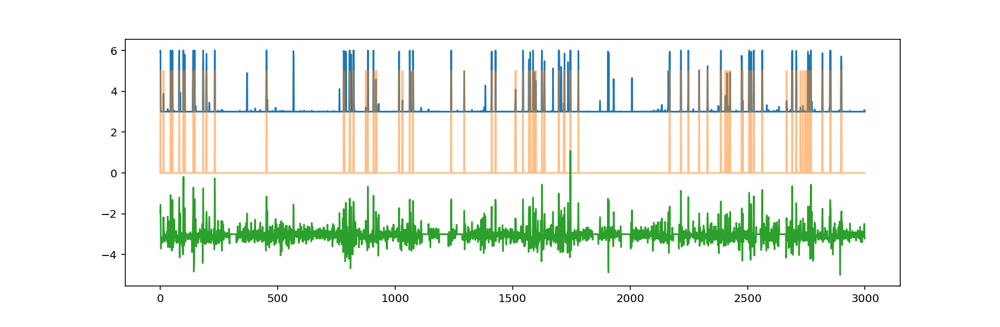

In [74]:
# Hardmasked with mappability data.
files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask2_nan10.txt.gz',
        '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/leftwindow_3.txt.gz',
         '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/rightwindow_3.txt.gz',
        '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/mappability_1dBinCounts_500_2R.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = normcol(X[labeled])
y_train = y[labeled]

bayes = BayesClassifier.from_samples(MultivariateGaussianDistribution, x_train, y_train)
output = bayes.predict_proba(x_train)
start=0
end=3000

plt.plot(output[:,1][start:end]*3 + 3)
plt.plot(y_train[start:end] * 5, alpha=0.5)
plt.plot(x_train[:,0][start:end] * 0.5 - 3)

Not much difference from hard masking or from adding mapability. I think it's important to run the prediction on all of 2R and just see where it's making errors.

In [105]:
# Hardmasked, running on all of 2R data.
files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask2_nan10.txt.gz',
        '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/leftwindow_3.txt.gz',
         '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/rightwindow_3.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = normcol(X[labeled])
y_train = y[labeled]

bayes = BayesClassifier.from_samples(MultivariateGaussianDistribution, x_train, y_train)
output2 = bayes.predict_proba(normcol(X))
start=6400
end=6800

plt.plot(output[:,1][start:end] + 3)
plt.plot(X[:,0][start:end] * 0.5 - 3)

In [89]:
# Function to write viewer files from probabilities with a threshold.
def probs_to_viewer(probs, thresh, chr_, outfile):
    with open(outfile, 'w') as out:
        for i in range(0, len(output)):
            val = probs[i]
            if val >= thresh:
                out.write(chr_ + '\t' + str(i) + '\t1\n')        

In [106]:
probs_to_viewer(output2[:,1], 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundarycalls_0p1.txt')            
probs_to_viewer(output2[:,1], 0.2, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundarycalls_0p2.txt')            
probs_to_viewer(output2[:,1], 0.5, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundarycalls_0p5.txt')            

In [107]:
# Also doing HMM:
# Full model.
d_b = MultivariateGaussianDistribution.from_samples(x_train[y_train.astype(bool)])
d_nb = MultivariateGaussianDistribution.from_samples(x_train[~y_train.astype(bool)])

s_nb = State(d_nb, name='notboundary')
s_b = State(d_b, name='boundary')

model = HiddenMarkovModel()
model.add_states(s_b, s_nb)
model.add_transition(model.start, s_b, 0.5)
model.add_transition(model.start, s_nb, 0.5)
model.add_transition(s_nb, s_nb, 0.974 )
model.add_transition(s_nb, s_b, 0.026 )
#model.add_transition(s_b, model.end, 0.001)
model.add_transition(s_b, s_b, 0.34)
model.add_transition(s_b, s_nb, 0.66)
model.bake()

output3 = model.predict(normcol(X), algorithm='viterbi')
start=0
end=3000

plt.plot(flip(output)[start:end]*3)
plt.plot(X[:,0][start:end] * 0.5 - 3)

In [109]:
probs_to_viewer(flip(output3), 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundarycalls_HMM.txt')            

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


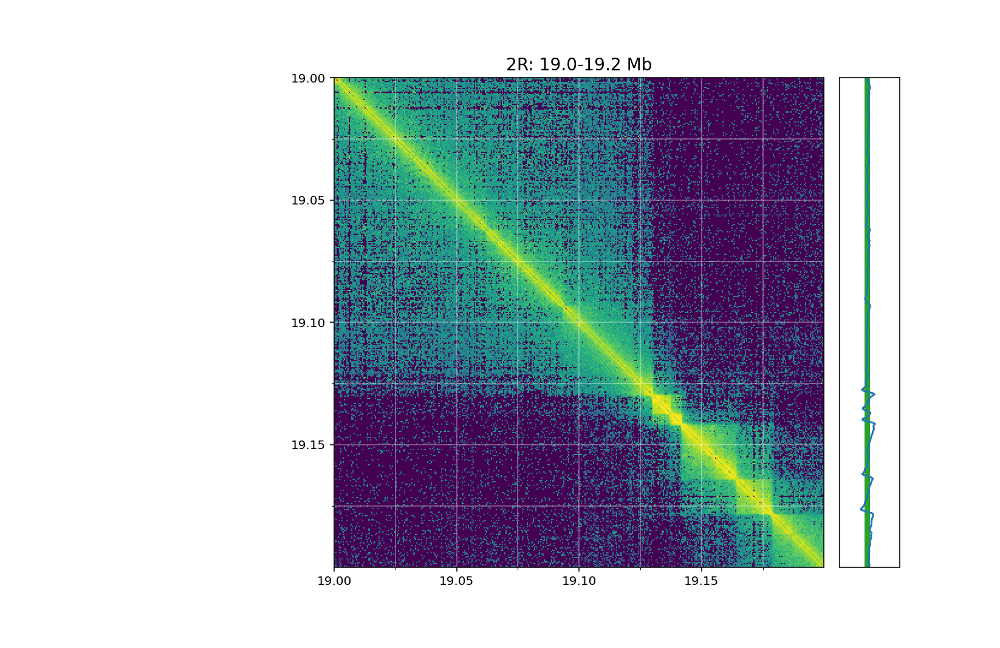

In [103]:
hc.viewer(data_folder, track_folder, save_folder)

In [131]:
# Hardmasked, just derivative data.
files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask2_nan10.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = X[labeled]
y_train = y[labeled]

bayes = NaiveBayes.from_samples(NormalDistribution, x_train, y_train)
output = bayes.predict_proba(X)

probs_to_viewer(output[:,1], 0.15, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundarycalls_deriv_0p15.txt')            

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


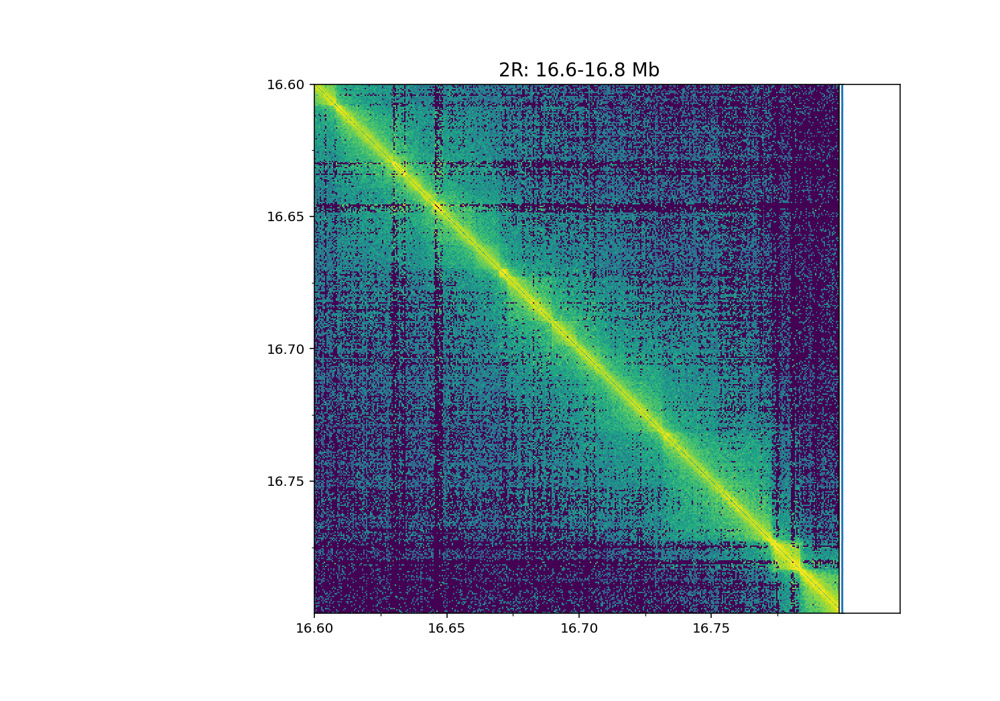

In [132]:
hc.viewer(data_folder, track_folder, save_folder)

How about local mappability? In a window, not just at the bin. Learn not to call boundaries in low-mappability regions. Alternately: just mask harder.

In [133]:
boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmasked_t5',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask5_nan10.txt',
              75,500, 'derivative', nan_buffersize=10)

boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmasked_t10',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask10_nan10.txt',
              75,500, 'derivative', nan_buffersize=10)

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


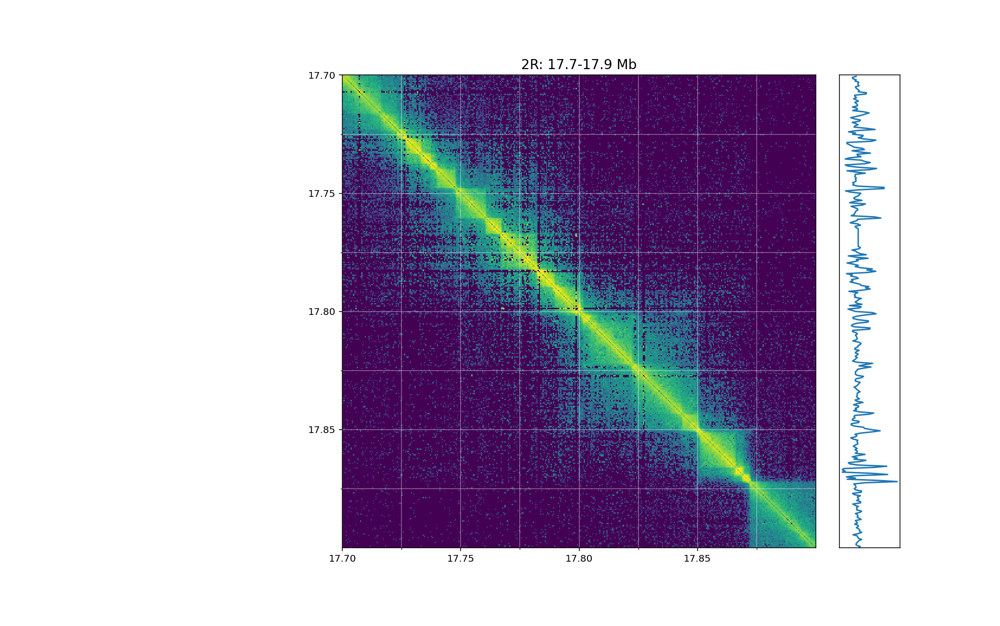

In [134]:
hc.viewer(data_folder, track_folder, save_folder)

Hard-masking with a cutoff of 10 seems to work quite well. What's left looks like mostly good boundaries. Might make sense to do a more principled test of different masking thresholds for the final product.

In [135]:
# Making left and right windows from hardmasked 10 data.
boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmasked_t10',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/leftwindow_3_hardmask10_nan10.txt',
              75,500, 'left', leftright_dist=3, nan_buffersize=10)

boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmasked_t10',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/rightwindow_3_hardmask10_nan10.txt',
              75,500, 'right', leftright_dist=3, nan_buffersize=10)

<IPython.core.display.Javascript object>


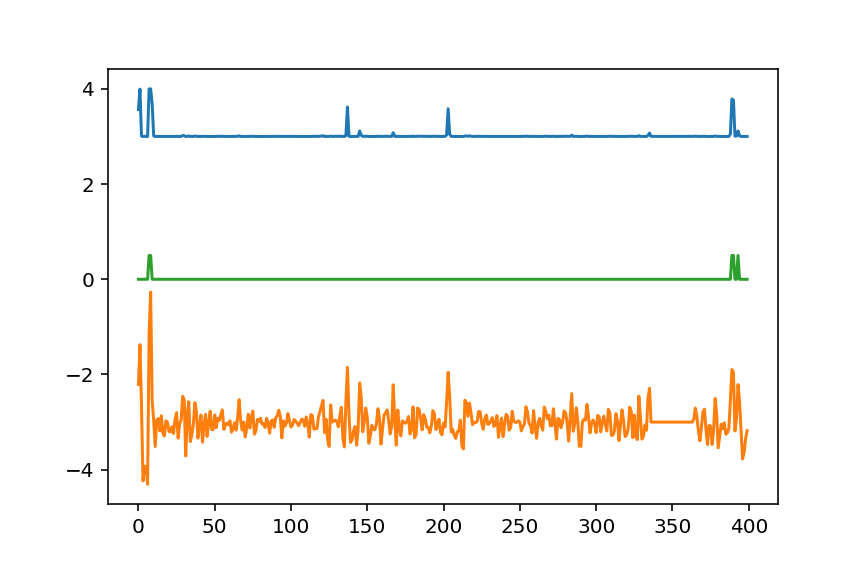

In [152]:
# Model with derivative and left-right scores.
files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask10_nan10.txt.gz',
        '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/leftwindow_3_hardmask10_nan10.txt.gz',
         '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/rightwindow_3_hardmask10_nan10.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = normcol(X[labeled])
y_train = y[labeled]

bayes = BayesClassifier.from_samples(MultivariateGaussianDistribution, x_train, y_train)
output = bayes.predict_proba(x_train)
start=6400
end=6800

plt.plot(output[:,1][start:end] + 3)
plt.plot(x_train[:,0][start:end] * 0.5 - 3)
plt.plot(y_train[start:end] * 0.5)


<IPython.core.display.Javascript object>


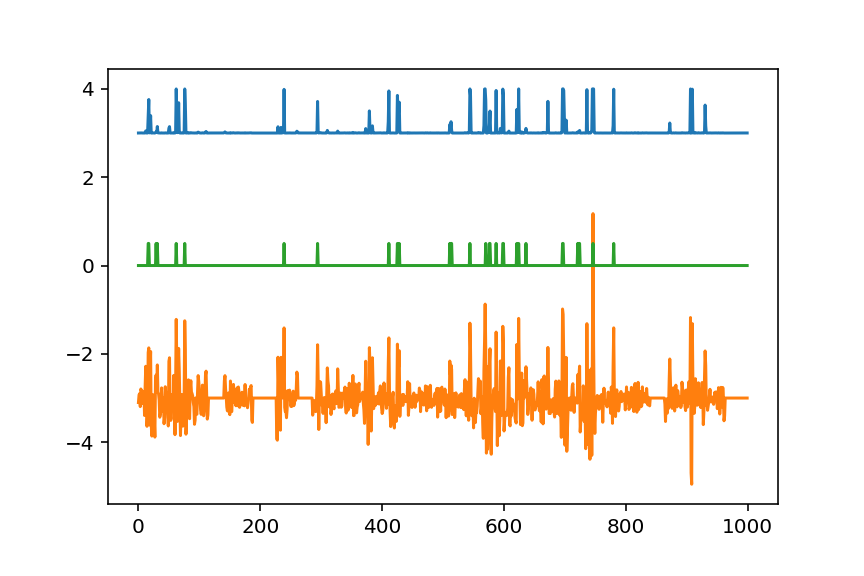

In [145]:
start=1000
end=2000

plt.plot(output[:,1][start:end] + 3)
plt.plot(x_train[:,0][start:end] * 0.5 - 3)
plt.plot(y_train[start:end] * 0.5)

In [147]:
# Model with derivative and left-right scores.
files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask10_nan10.txt.gz']

X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = normcol(X[labeled])
y_train = y[labeled]

bayes = NaiveBayes.from_samples(NormalDistribution, x_train, y_train)
output = bayes.predict_proba(x_train)


<IPython.core.display.Javascript object>


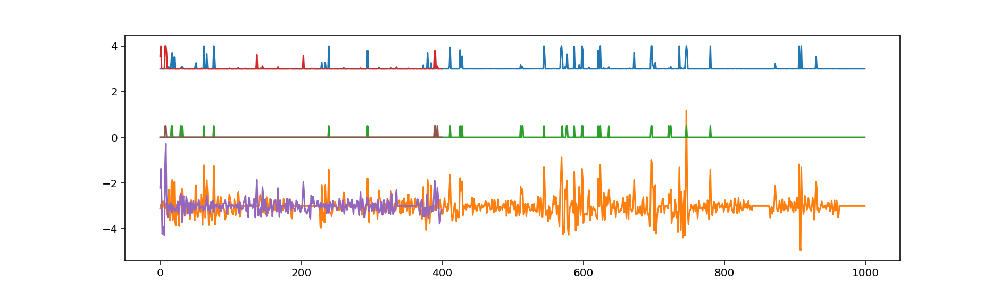

In [148]:
start=1000
end=2000

plt.plot(output[:,1][start:end] + 3)
plt.plot(x_train[:,0][start:end] * 0.5 - 3)
plt.plot(y_train[start:end] * 0.5)

In [337]:
# Function to write viewer files from probabilities with a threshold.
def probs_to_viewer(probs, thresh, chr_, outfile, mode='thresh'):
    with open(outfile, 'w') as out:
        for i in range(0, len(output)):
            val = probs[i]
            if mode == 'thresh':
                if val >= thresh:
                    out.write(chr_ + '\t' + str(i) + '\t1\n')
            elif mode == 'prob':
                out.write(chr_ + '\t' + str(i) + '\t' + str(val) + '\n')

In [158]:
# Model with derivative and left-right scores, get probs for whole chromosome.

files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask10_nan10.txt.gz',
        '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/leftwindow_3_hardmask10_nan10.txt.gz',
         '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/rightwindow_3_hardmask10_nan10.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = normcol(X[labeled])
y_train = y[labeled]

bayes = BayesClassifier.from_samples(MultivariateGaussianDistribution, x_train, y_train)
output = bayes.predict_proba(normcol(X))



In [159]:
probs_to_viewer(output[:,1], 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundaryprobs_hardmask10.txt', 'prob')

In [171]:
# Model with derivative only, get probs for whole chromosome.

files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask10_nan10.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = X[labeled]
y_train = y[labeled]

bayes = NaiveBayes.from_samples(NormalDistribution, x_train, y_train)
output = bayes.predict_proba(X)

In [172]:
probs_to_viewer(output[:,1], 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundaryprobs_hardmask10_deriv_only.txt', 'prob')

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


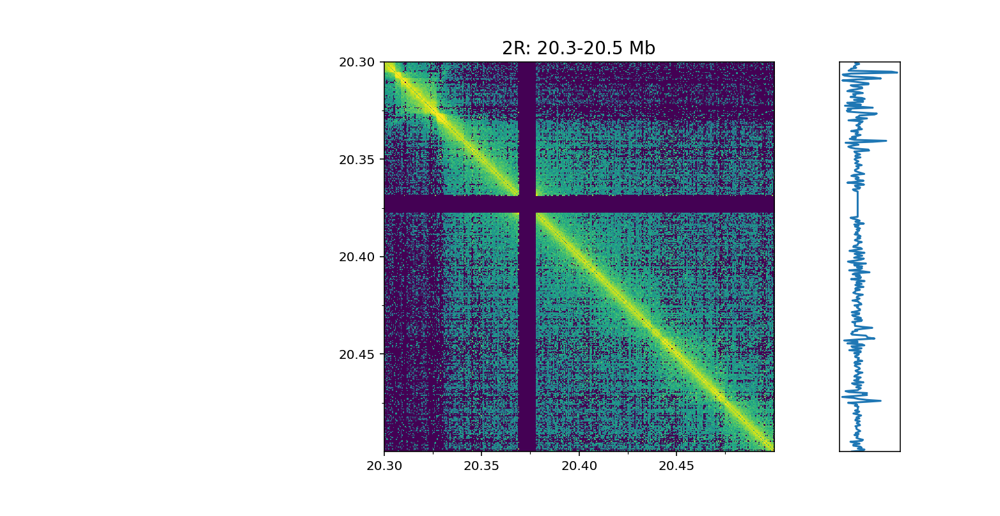

In [181]:
hc.viewer(data_folder, track_folder, save_folder)

Hardmaskin with a threshold of 10 looks, using the derivative only, looks quite good. It seems clear that adding the left-right directionality only confused things. It's possible that more measures from the Hi-C data directly (2nd derivative?, Additional moments?).

I'm re-running the mappability pipeline with more simulated reads (5x more) because I wasn't totally happy with the distribution of read counts:

<IPython.core.display.Javascript object>


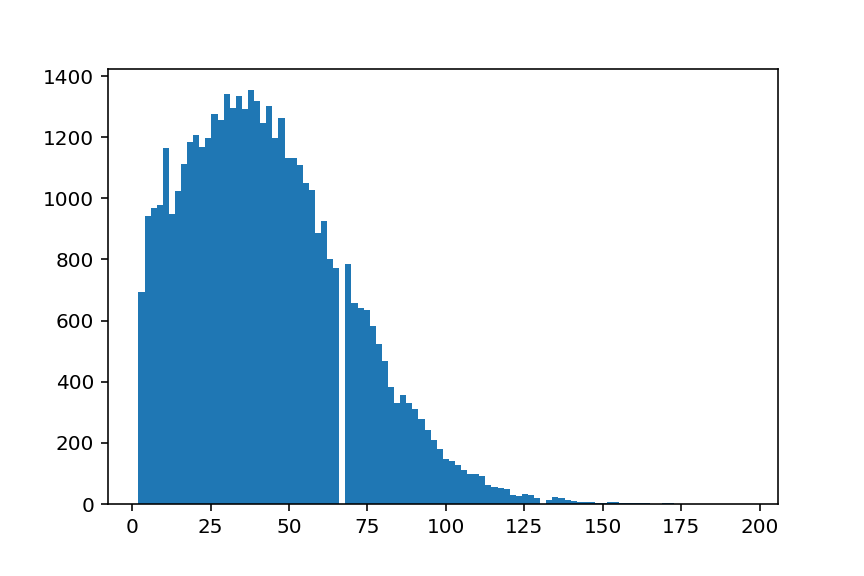

In [176]:
plt.hist(mability['2R'][mability['2R'] > 0], bins=100);


#### What about trying to smooth the data?

In [196]:
from scipy.ndimage import gaussian_filter
track = load_track_data('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask10_nan10.txt.gz')

<IPython.core.display.Javascript object>


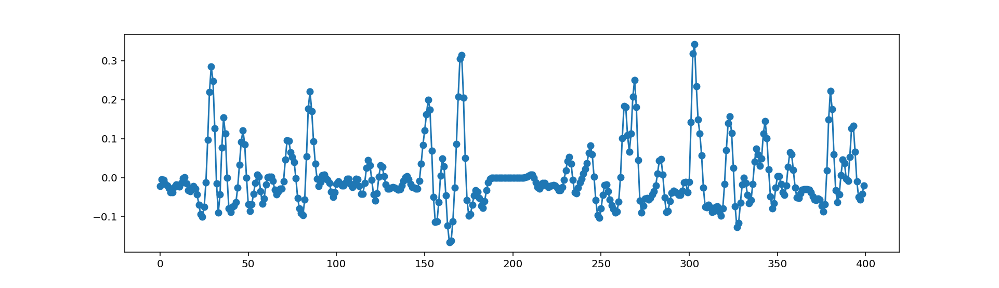

In [229]:
a = track['2R'].copy()
a1 = gaussian_filter(a, 1.5)
start = 12000
end = 12400
#plt.plot(a[start:end])
plt.plot(a1[start:end], marker="o")

<IPython.core.display.Javascript object>


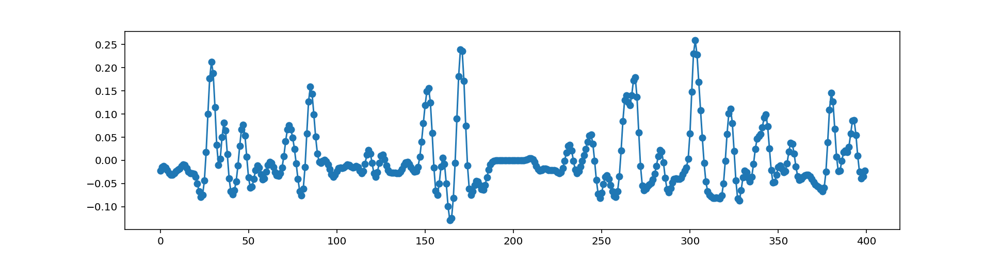

In [231]:
a = track['2R'].copy()
a1 = gaussian_filter(a, 2)
start = 12000
end = 12400
#plt.plot(a[start:end])
plt.plot(a1[start:end], marker="o")

In [234]:
a2 = gaussian_filter(a, 1)
probs_to_viewer(a2, 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask10_nan10_gauss1p0.txt', 'prob')
a2 = gaussian_filter(a, 1.5)
probs_to_viewer(a2, 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask10_nan10_gauss1p5.txt', 'prob')
a2 = gaussian_filter(a, 2)
probs_to_viewer(a2, 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask10_nan10_gauss2p0.txt', 'prob')

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


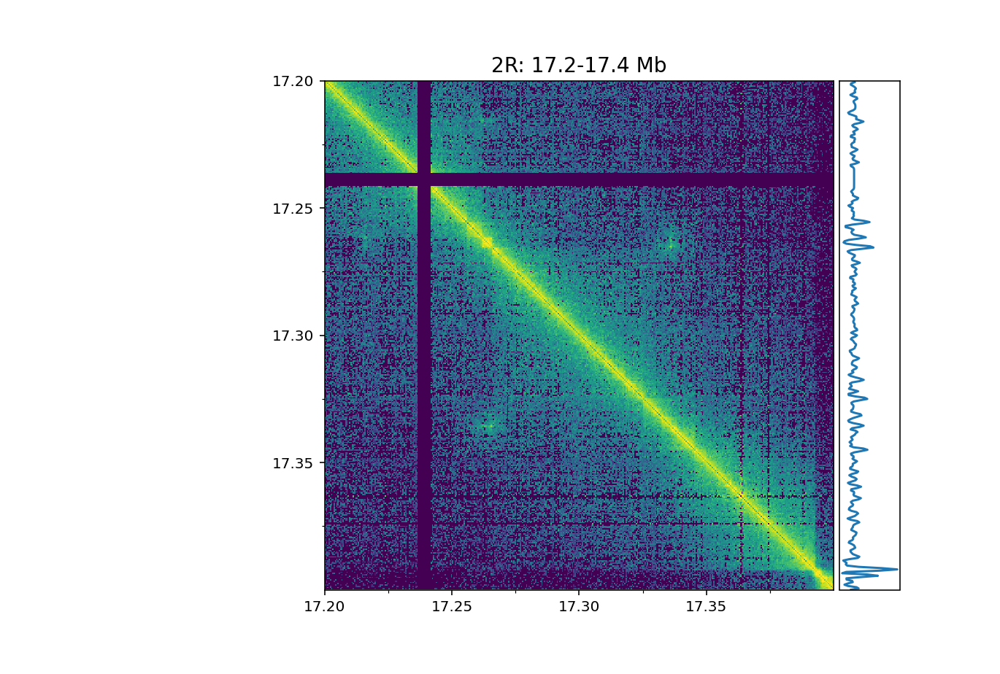

/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_masked/2R_26700000_26900000_500.txt


In [235]:
hc.viewer(data_folder, track_folder, save_folder)

Ugh I gotta be honest the 1.0 track looks really good. Wowzers. I'll try redoing the calling with this.

In [236]:
# Model with derivative only, get probs for whole chromosome.

files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask10_nan10_gauss1p0.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = X[labeled]
y_train = y[labeled]

bayes = NaiveBayes.from_samples(NormalDistribution, x_train, y_train)
output = bayes.predict_proba(X)

In [237]:
probs_to_viewer(output[:,1], 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundaryprobs_hardmask10_gauss1_deriv_only.txt', 'prob')

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


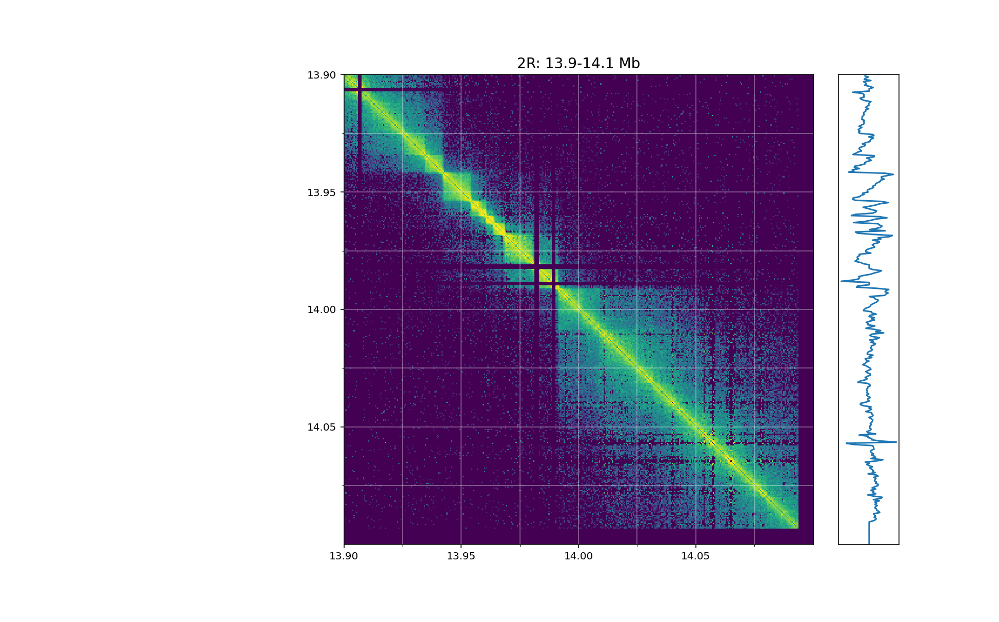

In [238]:
hc.viewer(data_folder, track_folder, save_folder)

### Roundup -- where are we so far?

Current routine:
- Hardmask the genome aggressively.
- Make directionality with large window (75).
- Take derivative (simple 1-bin difference) of 2-bin rolling average of directionality.
- Smooth derivative slightly (gaussian now, could be other).
- Train model on this data using hand calls.
- Produce a track of boundary probability at every position.

The only problems this seems to face is still coming from artefacts around low-coverage regions. This could be solved two ways: masking the genome better up front, or potentially adding a post-hoc step that filters out boundaries in/near low-coverage areas.

The only other task to do is to call boundaries with a specific threshold. I just need a simple function that takes the probability input and a threshold, processes consecutive boundary-called bins (assign boundary to center bin), and prints them. 

In [305]:
# Boundary calls from probability
a = track['2R'].copy()
probs = gaussian_filter(a, 1)

def boundary_call(probs_in, thresh):
    probs = probs_in.copy()
    # Replace nans with 0.
    probs[np.isnan(probs)] = 0
    # Make binary of over/under threshold.
    hits = (probs >= thresh).astype(int)
    # Set first and last to 0 -- createst problems if not.
    hits[0] = 0
    hits[-1] = 0
    # Find starts and stops of runs of 1s, take center bin as boundary location.
    run_starts = np.where((hits - np.roll(hits, 1)) == 1)[0]
    run_ends = np.where((hits - np.roll(hits, -1)) == 1)[0]
    centers = ((run_starts + run_ends) / 2).astype(int)
    return centers
    
boundary_call(probs, 0.3)

407

Re-ran mappability with many more reads. Counts are much higher now.

In [308]:
mappability = load_track_data('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/dm6_AATT_mappability2.txt.gz')

In [309]:
np.mean(mappability['2R'][mappability['2R'] > 0])

1701.4628658802972

In [310]:
np.std(mappability['2R'][mappability['2R'] > 0])

1040.628611773895

In [311]:
# Some code for "hardmasking" -- just using a simple threshold.

for t in [250, 500, 750, 1000, 1250]:
    outfile = '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/masking_mappability_hardthresh_' + str(t) + '.txt'
    out = open(outfile, 'w')
    for chr_ in mappability.keys():
        for i in range(0, len(mappability[chr_])):
            val = mappability[chr_][i]
            if (val <= t):
                out.write(chr_ + '\t' + str(i) + '\t1\n')
    out.close()

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


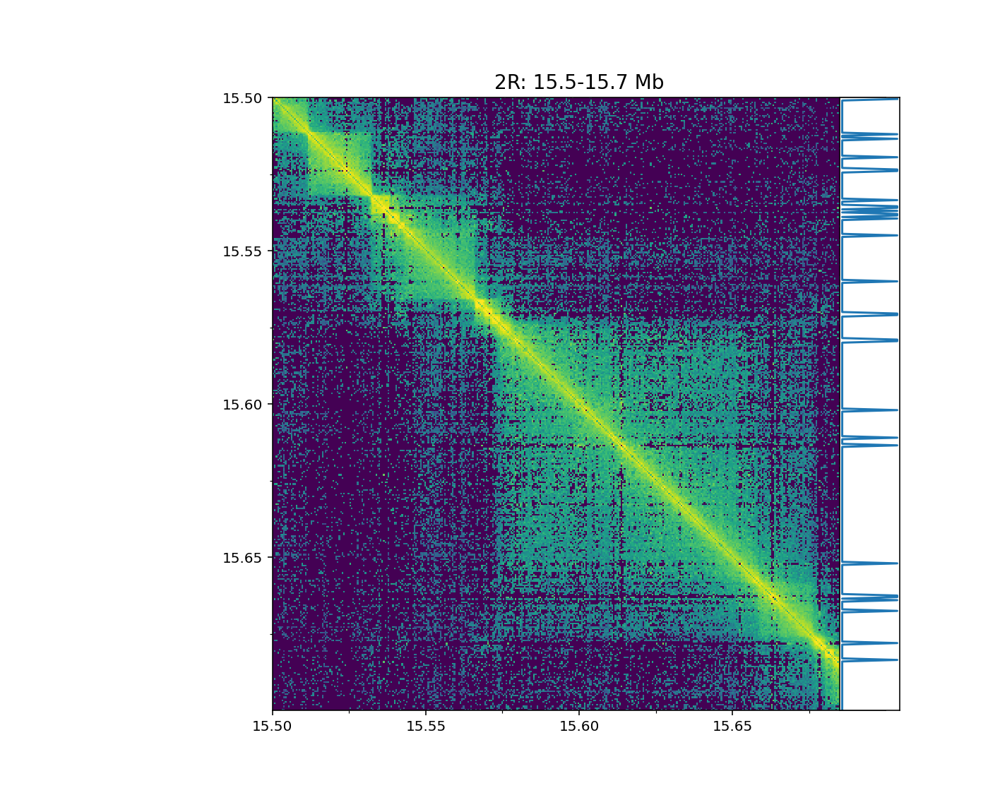

In [312]:
hc.viewer(data_folder, track_folder, save_folder)

250 and 500 seem like thresholds to try. I added a masking mode to boundary_score so that it takes a masking file and masks directionality scores. It also has a "dilation" option to extend the masking to adjacent bins. I think masking up front, masking the Hi-C panels themselves, is probably the smartest option, but having a masking option at this stage could also be useful.

In [349]:
boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask250.txt',
              75, 500, mode='derivative', nan_buffersize=10)

In [360]:
boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask500',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask500.txt',
              75, 500, mode='derivative', nan_buffersize=10)

In [361]:
track = load_track_data('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask250.txt.gz')
track = gaussian_filter(track['2R'], 1)
probs_to_viewer(track, 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask250_gauss1.txt', mode='prob')

track = load_track_data('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask500.txt.gz')
track = gaussian_filter(track['2R'], 1)
probs_to_viewer(track, 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask500_gauss1.txt', mode='prob')



In [363]:
files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/insscore_hardmask250_gauss1.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = X[labeled]
y_train = y[labeled]

bayes = NaiveBayes.from_samples(NormalDistribution, x_train, y_train)
output = bayes.predict_proba(X)
probs_to_viewer(output[:,1], 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundaryprobs_hardmask250.txt', mode='prob')

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


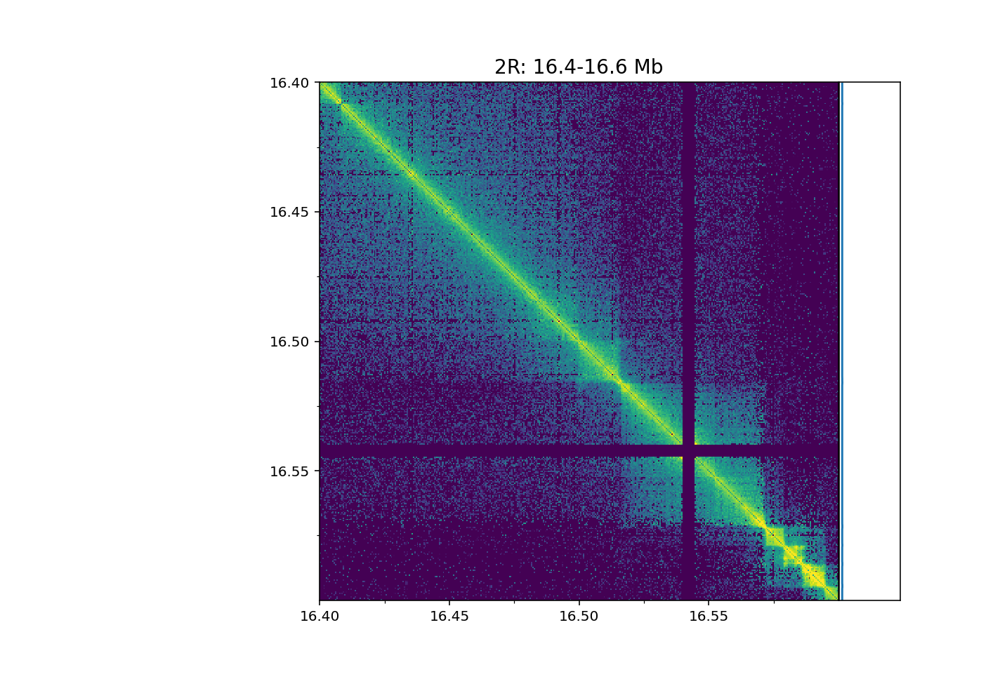

In [364]:
hc.viewer(data_folder, track_folder, save_folder)

OK 250 masking looks MUCH better. 500 clearly masks too much and crushes real signal. In the future, it's gonna definitely be important to come up with some principled way to select the masking threshold. 

Tomorrow: Add feature withing directionality of boundary_score that assigns to each bin the fraction of reads crossing this bin from some fixed distance. So for example bin 100 gets assigned the ratio reads from position 97 that lie to the right of 100 compared to to the left of 100. It can be implemented as a lagged form of directionality (directionality will be this with a lag of 0). It should behave a lot like directionality and can be used to learning to clean up bad calls. Was able to fix this wiht a simple addition of a lag term the the window founction in boundary_scores. -3 will be three to the left, +3 will be three to the right.

In [366]:
boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundscore_left2_hardmask250.txt',
              75, 500, mode='derivative', nan_buffersize=10, lag=-2)

In [386]:
boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundscore_left5_hardmask250.txt',
              75, 500, mode='derivative', nan_buffersize=10, lag=-5)

In [385]:
boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundscore_right5_hardmask250.txt',
              75, 500, mode='derivative', nan_buffersize=10, lag=5)

In [369]:
boundary_score('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
              '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundscore_right3_hardmask250.txt',
              75, 500, mode='derivative', nan_buffersize=10, lag=3)

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


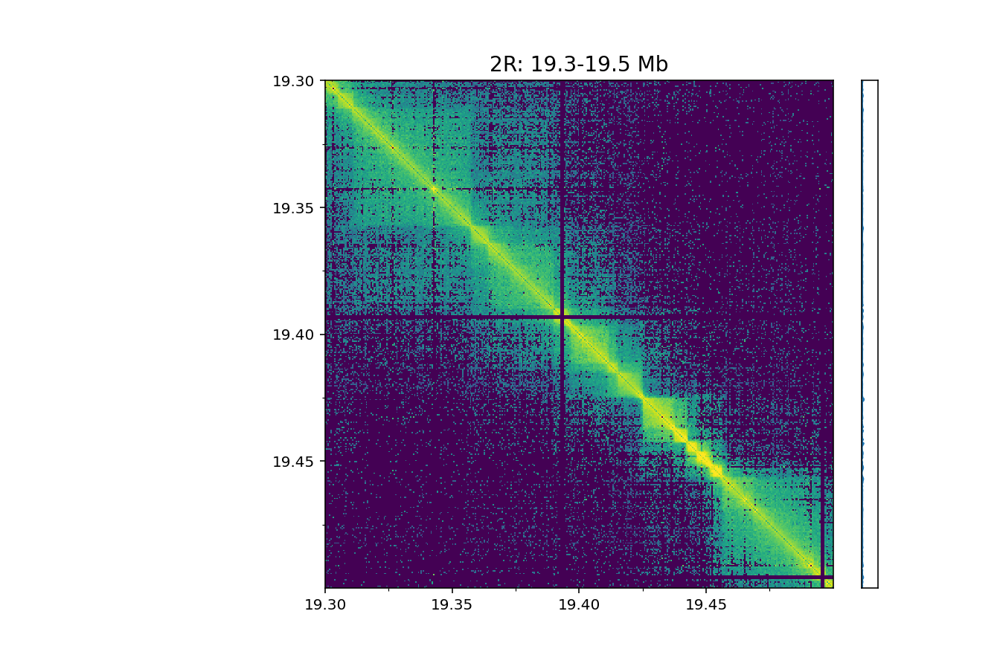

In [387]:
hc.viewer(data_folder, track_folder, save_folder)

In [382]:
left = load_track_data('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundscore_left3_hardmask250.txt.gz')
right = load_track_data('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundscore_right3_hardmask250.txt.gz')

<IPython.core.display.Javascript object>


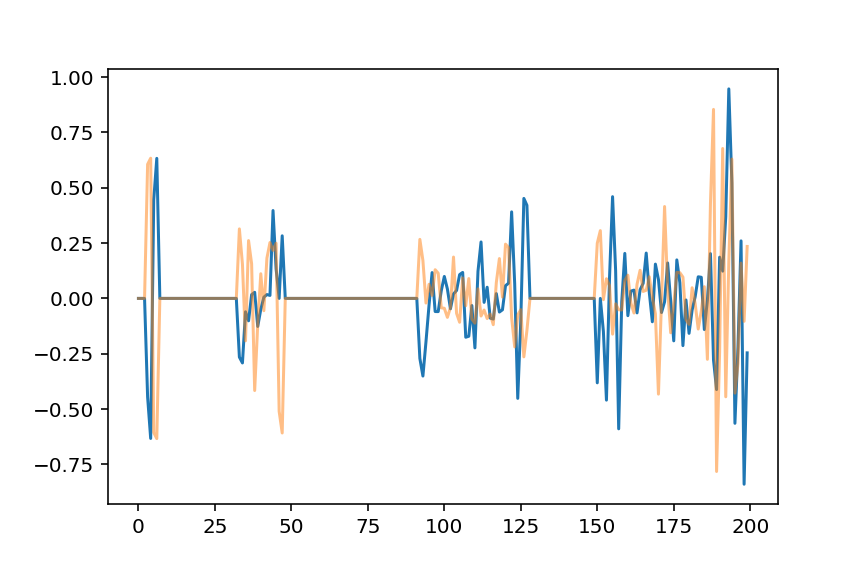

In [384]:
start = 7000
end=7200

plt.plot(left['2R'][start:end])
plt.plot(right['2R'][start:end], alpha=0.5)

In [440]:
d=4
size = (d*4)-1
y, x = hc.mesh_like(np.ones((size,size)), 2)
# Make a grid of distances to the diagonal, with positive values to upper right.
dist_diag = x-y
midpoint = int(size/ 2)
# Define insulated region as top right quadrant (when displayed as an image: y-axis is backwards).
insulated_region = (x > midpoint) & (y < midpoint)
noninsulated_region = (x < midpoint) | (y > midpoint)

<IPython.core.display.Javascript object>


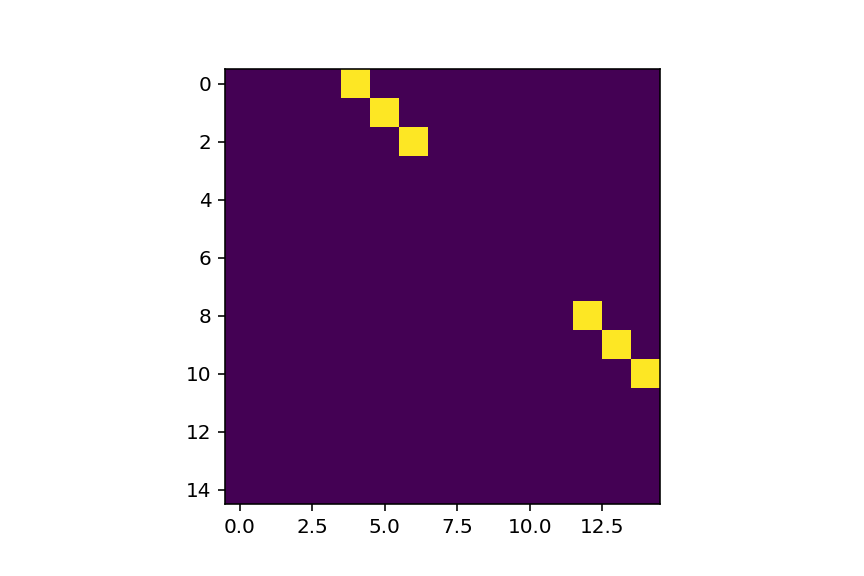

In [443]:
plt.imshow(insulated_region & (dist_diag==d))
plt.imshow(noninsulated_region & (dist_diag==d))

In [486]:
import re
import os
import pandas as pd
import gzip

def boundary_score_geom(infolder, outfilepath, dist=4, binsize=500, sigma=1):
    
    def not_valid_file(filename):
        if (re.search('txt.gz', filename)):
            name_items = re.sub('.txt.gz', '', filename)
            if (len(name_items.split('_')) == 4):
                return False
        return True
    
    def add_panel(infolder, filename, scores, dist, binsize, chr_maxes, chr_max_bins, insulated, noninsulated):
        if not_valid_file(filename):
            return
        x = np.genfromtxt(os.path.join(infolder, filename))
        x[x == 0] = 0.5
        
        name_items = re.sub('.txt.gz', '', filename)
        chr_, start, end, file_binsize = name_items.split('_')
        start_bin = int(int(start) / binsize)
        end_bin = int(int(end) / binsize)
        
        if (int(file_binsize) == binsize):
            if (chr_ not in scores):
                scores[chr_] = np.zeros(chr_max_bins)
            if (chr_ not in chr_maxes):
                chr_maxes[chr_] = end_bin
            if (end_bin > chr_maxes[chr_]):
                chr_maxes[chr_] = end_bin
                
            panel_size_bins = end_bin - start_bin
            for n in range(2*dist, panel_size_bins - (2*dist) + 1):
                start = n - (2*dist) + 1
                stop = n + (2*dist) 
                local_vals = x[start:stop, start:stop]
                insulated_vals = local_vals[insulated]
                noninsulated_vals = local_vals[noninsulated]
                #print(insulated_vals)
                insulated_nan_count = np.count_nonzero(np.isnan(insulated_vals))
                insulated_nonnan_count = np.count_nonzero(~np.isnan(insulated_vals))
                noninsulated_nan_count = np.count_nonzero(np.isnan(noninsulated_vals))
                noninsulated_nonnan_count = np.count_nonzero(~np.isnan(noninsulated_vals))
                #print(insulated_nan_count, insulated_nonnan_count, noninsulated_nan_count, noninsulated_nonnan_count)
                if (((insulated_nonnan_count / (insulated_nan_count + insulated_nonnan_count)) >= 0.8 ) & 
                    ((noninsulated_nonnan_count / (noninsulated_nan_count + noninsulated_nonnan_count)) >= 0.5 )):
                    mean_insulated = np.nanmean(insulated_vals)
                    mean_noninsulated = np.nanmean(noninsulated_vals)
                    logratio = np.log(mean_noninsulated / mean_insulated)
                    genome_bin = start_bin + n
                    scores[chr_][genome_bin] = logratio
        
    chr_max_size = 1e8
    chr_max_bins = int(chr_max_size // binsize)
    chr_maxes = {}
    scores = {}
    files = os.listdir(infolder)

    # Get matrix stuff.
    size = (dist*4)-1
    y, x = hc.mesh_like(np.ones((size,size)), 2)
    # Make a grid of distances to the diagonal, with positive values to upper right.
    dist_diag = x-y
    midpoint = int(size/ 2)
    # Define insulated region as top right quadrant (when displayed as an image: y-axis is backwards).
    insulated = (x > midpoint) & (y < midpoint) & (dist_diag == dist)
    noninsulated = ((x < midpoint) | (y > midpoint)) & (dist_diag == dist)
    
    for file in files:
        add_panel(infolder, file, scores, dist, binsize, chr_maxes, chr_max_bins, insulated, noninsulated)

    
    outfile = open(outfilepath, 'w')
    for chr_ in chr_maxes.keys():
        scores[chr_] = gaussian_filter(scores[chr_], sigma)
        for bin_ in range(0, chr_maxes[chr_]):
            score = scores[chr_][bin_]
            if (score != 0):
                outfile.write(chr_ + '\t' + str(bin_) + '\t' + str(score) + '\n')
    outfile.close()

In [480]:
boundary_score_geom('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
                   '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/geomscore_dist3_hardmask250.txt',
                   dist=3)
boundary_score_geom('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
                   '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/geomscore_dist4_hardmask250.txt',
                   dist=4)
boundary_score_geom('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
                   '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/geomscore_dist5_hardmask250.txt',
                   dist=5)
boundary_score_geom('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
                   '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/geomscore_dist6_hardmask250.txt',
                   dist=6)
boundary_score_geom('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
                   '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/geomscore_dist7_hardmask250.txt',
                   dist=7)
boundary_score_geom('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
                   '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/geomscore_dist10_hardmask250.txt',
                   dist=10)

In [487]:
boundary_score_geom('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
                   '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/geomscore_dist3_sigma1_hardmask250.txt',
                   dist=3, sigma=1)
boundary_score_geom('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
                   '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/geomscore_dist4_sigma1_hardmask250.txt',
                   dist=4, sigma=1)

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


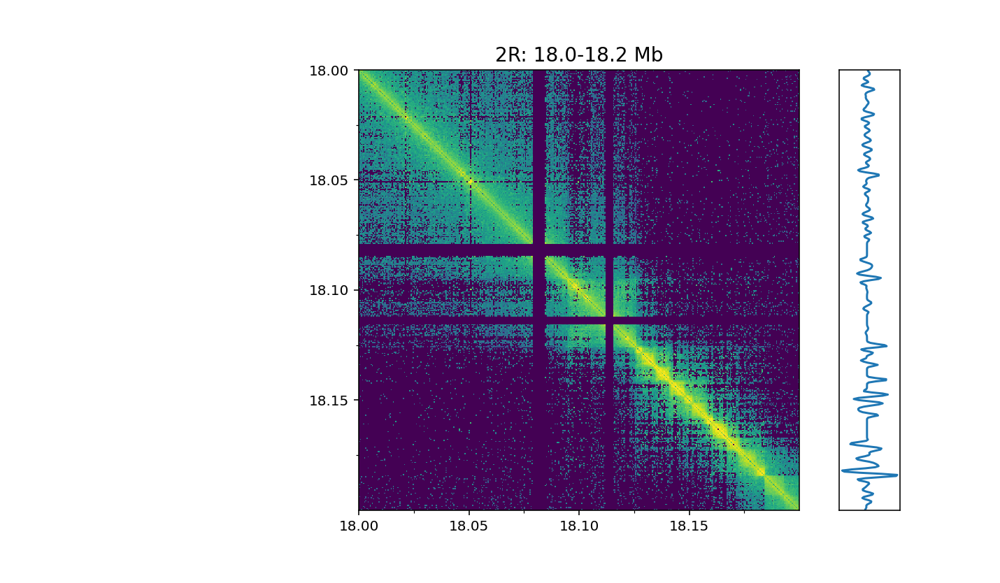

In [488]:
hc.viewer(data_folder, track_folder, save_folder)

In [493]:
import re
import os
import pandas as pd
import gzip

def boundary_score_directionality(infolder, outfilepath, windowsize=75, diff_window=1, binsize=500, mode='directionality', nan_buffersize=3, sigma=0):
    
    def not_valid_file(filename):
        if (re.search('txt.gz', filename)):
            name_items = re.sub('.txt.gz', '', filename)
            if (len(name_items.split('_')) == 4):
                return False
        return True
    
    def add_panel(infolder, filename, scores, windowsize, binsize, chr_maxes, chr_max_bins, nan_buffersize):
        min_nonnan = 0.7 * nan_buffersize
        if not_valid_file(filename):
            return
        x = np.genfromtxt(os.path.join(infolder, filename))
        #x[np.isnan(x)] = 0.5
        x[x == 0] = 0.5
        
        name_items = re.sub('.txt.gz', '', filename)
        chr_, start, end, file_binsize = name_items.split('_')
        start_bin = int(int(start) / binsize)
        end_bin = int(int(end) / binsize)
        
        if (int(file_binsize) == binsize):
            if (chr_ not in scores):
                scores[chr_] = np.zeros(chr_max_bins)
            if (chr_ not in chr_maxes):
                chr_maxes[chr_] = end_bin
            if (end_bin > chr_maxes[chr_]):
                chr_maxes[chr_] = end_bin
                
            panel_size_bins = end_bin - start_bin
            for n in range(windowsize, panel_size_bins - windowsize + 1):
                left_window = x[n, (n-windowsize):n]
                right_window = x[n, (n+1):(n+windowsize+1)]
                if ((np.count_nonzero(~np.isnan(left_window[(-1 * nan_buffersize):])) > min_nonnan) and
                    (np.count_nonzero(~np.isnan(right_window[:nan_buffersize])) > min_nonnan)):
                    mean_left = np.nanmean(left_window)
                    mean_right = np.nanmean(right_window)
                    logratio = np.log(mean_right / mean_left)
                    genome_bin = start_bin + n
                    scores[chr_][genome_bin] = logratio
        
    
    chr_max_size = 1e8
    chr_max_bins = int(chr_max_size // binsize)
    chr_maxes = {}
    scores = {}
    files = os.listdir(infolder)
    
    for file in files:
        add_panel(infolder, file, scores, windowsize, binsize, chr_maxes, chr_max_bins, nan_buffersize)
        
    outfile = open(outfilepath, 'w')
    for chr_ in chr_maxes.keys():
        if mode == 'derivative':
            roll_avg = pd.Series(scores[chr_]).rolling(2).mean()
            # Because differences are subtracted from the left, we need rolling averages assigned
            # to the left as well. There's no way to do that in rolling function, so series is  
            # manually shifted 1 position to left.
            roll_avg = roll_avg.shift(-1)
            scores[chr_] = roll_avg.diff(diff_window)
            if (sigma > 0):
                scores[chr_] = gaussian_filter(scores[chr_], sigma)
        
        for bin_ in range(0, chr_maxes[chr_]):
            score = scores[chr_][bin_]
            if (score != 0):
                outfile.write(chr_ + '\t' + str(bin_) + '\t' + str(score) + '\n')
    outfile.close()

In [494]:
boundary_score_directionality('/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_panels_2R_hardmask250',
                   '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/derivscore_sigma1_hardmask250.txt',
                   mode='derivative', sigma=1)

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


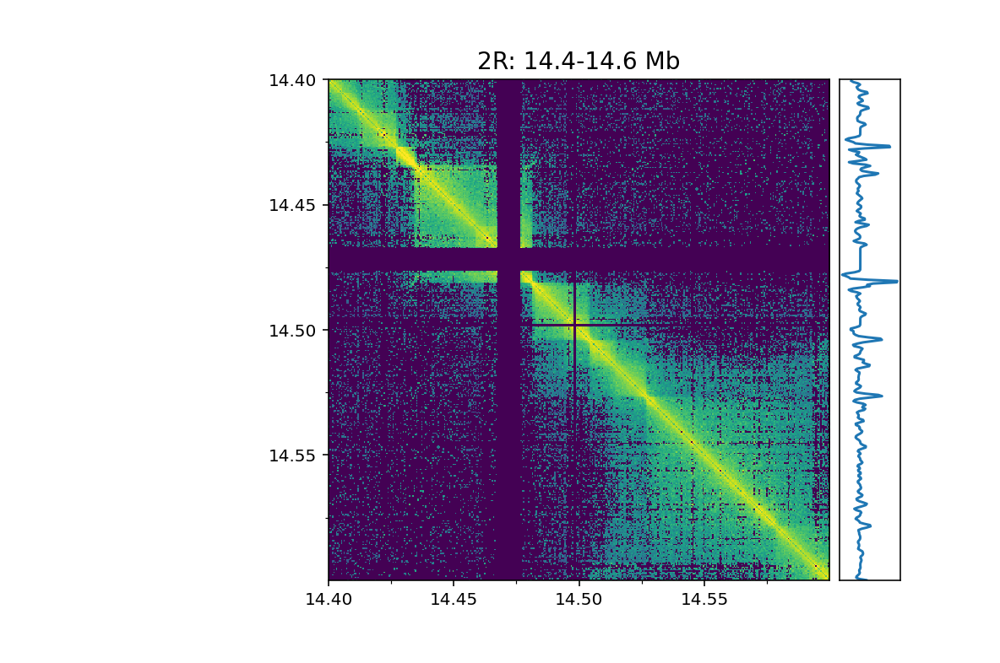

In [495]:
hc.viewer(data_folder, track_folder, save_folder)

In [497]:
files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/derivscore_sigma1_hardmask250.txt.gz',
        '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/geomscore_dist3_sigma1_hardmask250.txt.gz',
        '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/geomscore_dist4_sigma1_hardmask250.txt.gz']
X = make_sample_data(files, 3e7)

c_files = ['/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2a_clickedcoords_2021-02-02-3.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2b_clickedcoords_2021-02-02-4.txt',
          '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/saves/test_2R/training_2c_clickedcoords_2021-02-02-2.txt'
          ]
y = labels_from_hand_calls(c_files, X[:,0], adjacent=4)
labeled = y != -1

x_train = X[labeled]
y_train = y[labeled]

bayes = BayesClassifier.from_samples(MultivariateGaussianDistribution, x_train, y_train)
output = bayes.predict_proba(X)
probs_to_viewer(output[:,1], 0.1, '2R', '/Users/michaelstadler/Bioinformatics/Projects/insulators/viewer_data/boundary_caller_tracks/boundaryprobs_2.txt', mode='prob')

GridspecLayout(children=(Dropdown(description='Chrom', layout=Layout(grid_area='widget001'), options=('2R',), …

<IPython.core.display.Javascript object>


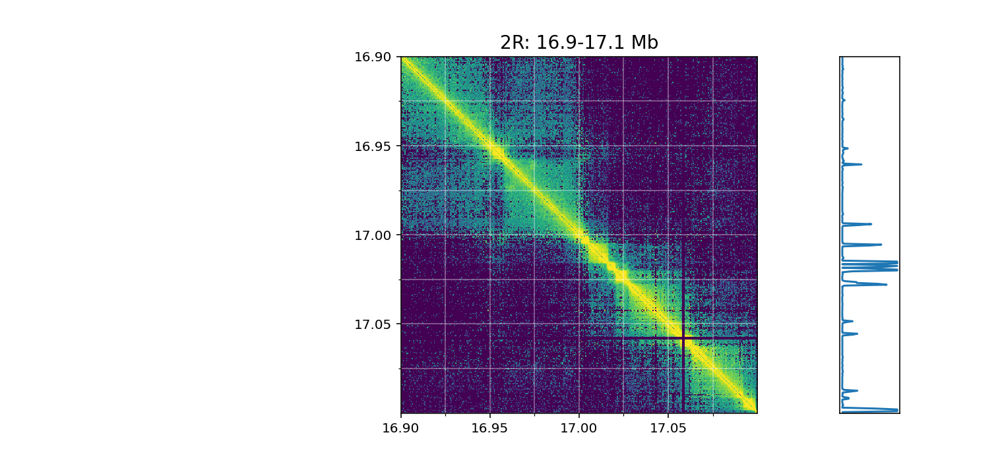

In [498]:
hc.viewer(data_folder, track_folder, save_folder)